In [1]:
%load_ext watermark
%load_ext autoreload

import numpy as np
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib as mpl

import cartopy.crs as ccrs

sys.path.append("/glade/u/home/bbuchovecky/projects/utils")
import timeseries_processing as tsp
%aimport timeseries_processing
%autoreload 1

%watermark -iv -co -v

Python implementation: CPython
Python version       : 3.11.6
IPython version      : 8.16.1

conda environment: clisci

xarray    : 2023.10.1
sys       : 3.11.6 | packaged by conda-forge | (main, Oct  3 2023, 10:40:35) [GCC 12.3.0]
matplotlib: 3.8.0
cartopy   : 0.22.0
numpy     : 1.24.4



In [14]:
def get_flat10_variable(variable, domain, case, time_range=['0001-01', '0003-12'], experiment='ctrl-esm', use_mfdataset=False, verbose=False, reindex_like=None):
    '''
    Loads a single variable for a given time range from a FLAT10 simulation.
    '''
    # Get the CESM2 component for the given domain
    comp_dict = {
        'atm': 'cam',
        'lnd': 'clm2',
    }
    comp = comp_dict[domain]

    # Get the archive directory for the given case
    case_archive_dict = {
        '':            '/glade/campaign/cgd/tss/lawrence/archive',
        'leafcn_high': '/glade/derecho/scratch/bbuchovecky/archive',
        'leafcn_low':  '/glade/derecho/scratch/bbuchovecky/archive',
    }
    archive_dir = case_archive_dict[case]

    # Add a <.> delimiter for the file name
    if case != '':
        case = '.'+case

    # Construct the case name
    case_name = f'b.e21.B1850.f09_g17.FLAT10{experiment}.001{case}'

    time_start = time_range[0]
    time_end = time_range[1]

    # FLAT10ctrl-esm simulation with standard parameter set only goes until 0030-12
    if (case == '') and (int(time_end[:4]) > 30):
        time_end = '0030-12'

    if use_mfdataset:
        try:
            # Construct the file path with a wildcard for the time period
            glob_file_name = f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0.*.nc'

            concat_da = xr.open_mfdataset(glob_file_name)
            concat_da = concat_da[variable].sel(time=slice(time_start, time_end))
    
        except OverflowError:
            print('OverflowError: manually loading and concatenating each monthly output file')
            use_mfdataset = False
    
    if not use_mfdataset:
        da_list = []
        
        start_year = int(time_start[:4])
        start_month = int(time_start[5:])

        end_year = int(time_end[:4])
        end_month = int(time_end[5:])

        total_length_in_months = (end_year - start_year)*12 + end_month
        if verbose: print(f'length of timeseries [month]: {str(total_length_in_months).zfill(4)}')

        for year in range(start_year, end_year):
            for month in range(1, 13):
                da = xr.open_dataset(f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0.{str(year).zfill(4)}-{str(month).zfill(2)}.nc')[variable]
                da_list.append(da.copy(deep=True))

        for month in range(1, end_month+1):
            da = xr.open_dataset(f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0.{str(end_year).zfill(4)}-{str(month).zfill(2)}.nc')[variable]
            da_list.append(da.copy(deep=True))    

        concat_da = xr.concat(da_list, 'time')
    
    if ('time' in concat_da.dims) and (concat_da.time.size > 1):
        concat_da = concat_da.sel(time=slice(time_start, time_end))
    
    if reindex_like is not None:
        concat_da = concat_da.reindex(lat=reindex_like.lat, lon=reindex_like.lon, method='nearest', tolerance=1e-4)

    return concat_da

In [12]:
def plot_land_area_average_timeseries(variable, domain, time_range=['0001-01', '0003-12'], experiment='ctrl-esm', use_mfdataset=False, time_average='month'):
    std = get_flat10_variable(variable, domain, '', time_range, experiment, use_mfdataset)
    hgh = get_flat10_variable(variable, domain, 'leafcn_high', time_range, experiment, use_mfdataset, reindex_like=std)

    if time_average == 'year':
        std = tsp.calculate_annual_timeseries(std)
        hgh = tsp.calculate_annual_timeseries(hgh)

    landarea = get_flat10_variable('area', 'lnd', '', time_range=['0001-01', '0001-01']).isel(time=0)
    landfrac = get_flat10_variable('landfrac', 'lnd', '', time_range=['0001-01', '0001-01']).isel(time=0)
    landweights = (landarea*landfrac)/(landarea*landfrac).sum(dim=['lat', 'lon'])

    ((std*landweights).sum(dim=['lat','lon'])/landweights.sum(dim=['lat','lon'])).plot(label='std')
    ((hgh*landweights).sum(dim=['lat','lon'])/landweights.sum(dim=['lat','lon'])).plot(label='hgh')
    plt.legend()
    plt.title(f'area-averaged {variable} over land')


def plot_land_area_integrated_timeseries(variable, domain, time_range=['0001-01', '0003-12'], experiment='ctrl-esm', use_mfdataset=False, time_average='month'):
    std = get_flat10_variable(variable, domain, '', time_range, experiment, use_mfdataset)
    hgh = get_flat10_variable(variable, domain, 'leafcn_high', time_range, experiment, use_mfdataset, reindex_like=std)

    if time_average == 'year':
        std = tsp.calculate_annual_timeseries(std)
        hgh = tsp.calculate_annual_timeseries(hgh)

    landarea = get_flat10_variable('area', 'lnd', '', time_range=['0001-01', '0001-01']).isel(time=0)
    landfrac = get_flat10_variable('landfrac', 'lnd', '', time_range=['0001-01', '0001-01']).isel(time=0)

    (std*landarea*landfrac*1e6).sum(dim=['lat','lon']).plot(label='std')
    (hgh*landarea*landfrac*1e6).sum(dim=['lat','lon']).plot(label='hgh')
    plt.legend()
    plt.title(f'area-integrated {variable} over land')


def plot_area_average_timeseries(variable, domain, time_range=['0001-01', '0003-12'], experiment='ctrl-esm', use_mfdataset=False, time_average='month'):
    std = get_flat10_variable(variable, domain, '', time_range, experiment, use_mfdataset)
    hgh = get_flat10_variable(variable, domain, 'leafcn_high', time_range, experiment, use_mfdataset, reindex_like=std)

    if time_average == 'year':
        std = tsp.calculate_annual_timeseries(std)
        hgh = tsp.calculate_annual_timeseries(hgh)
    
    area = get_flat10_variable('AREA', 'atm', '', time_range=['0001-01', '0001-01']).isel(time=0)
    weights = area/area.sum(dim=['lat', 'lon'])

    ((std*weights).sum(dim=['lat','lon'])/weights.sum(dim=['lat','lon'])).plot(label='std')
    ((hgh*weights).sum(dim=['lat','lon'])/weights.sum(dim=['lat','lon'])).plot(label='hgh')
    plt.legend()
    plt.title(f'area-averaged {variable}')

In [4]:
area_std = get_flat10_variable('AREA', 'atm', '', time_range=['0001-01', '0001-01']).isel(time=0)
area_hgh = get_flat10_variable('AREA', 'atm', 'leafcn_high', time_range=['0001-01', '0001-01']).isel(time=0)
area_hgh_reindex = area_hgh.reindex_like(area_std, method='nearest', tolerance=1e-4)

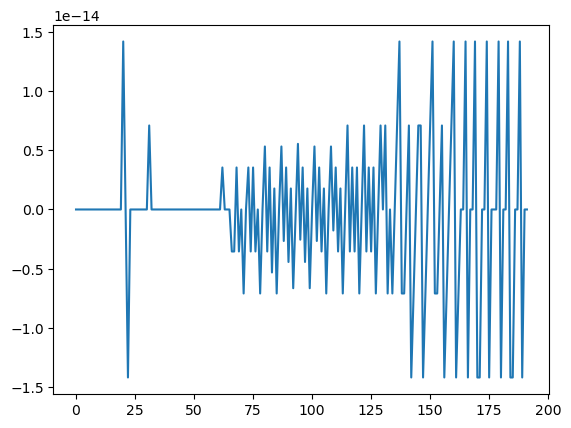

In [13]:
plt.plot(np.arange(192), area_hgh.lat.values - area_std.lat.values)

In [20]:
%%time
lai_hgh_nomf = get_flat10_variable('TLAI', 'lnd', 'leafcn_high', time_range=['0001-01', '0042-12'], experiment='ctrl-esm', use_mfdataset=False, verbose=False, reindex_like=None)

CPU times: user 51.2 s, sys: 2.65 s, total: 53.9 s
Wall time: 1min 4s


In [31]:
%%time
lai_std_nomf = get_flat10_variable('TLAI', 'lnd', '', time_range=['0001-01', '0042-12'], experiment='ctrl-esm', use_mfdataset=False, verbose=False, reindex_like=None)

CPU times: user 36.4 s, sys: 17.3 s, total: 53.7 s
Wall time: 1min 52s


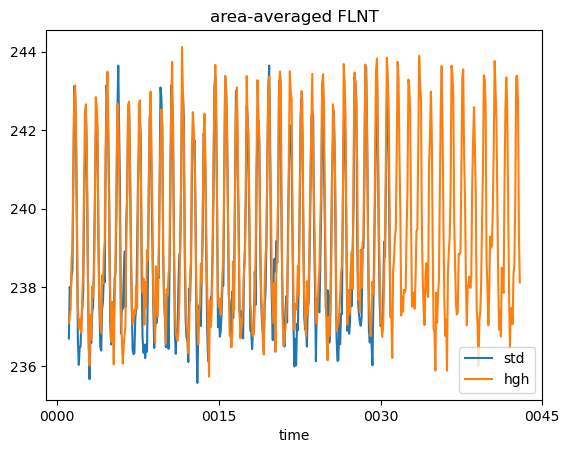

In [54]:
plot_area_average_timeseries('FLNT', 'atm', time_range=['0001-01','0042-12'])

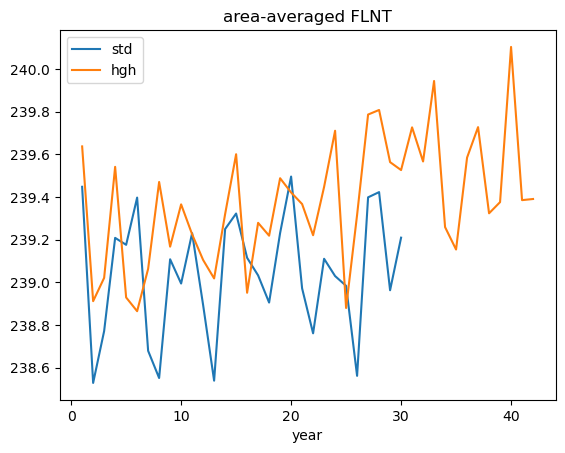

In [55]:
plot_area_average_timeseries('FLNT', 'atm', time_range=['0001-01','0042-12'], time_average='year')

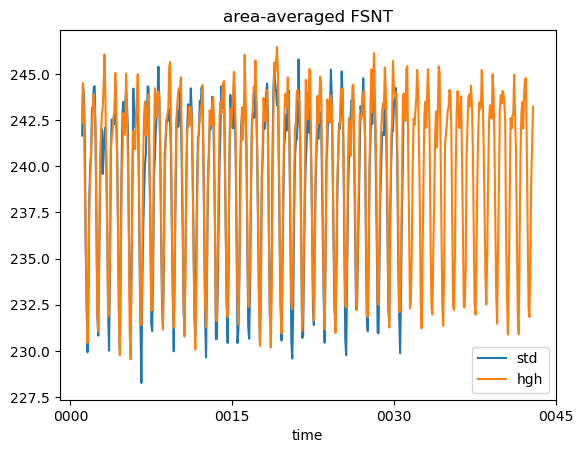

In [56]:
plot_area_average_timeseries('FSNT', 'atm', time_range=['0001-01','0042-12'])

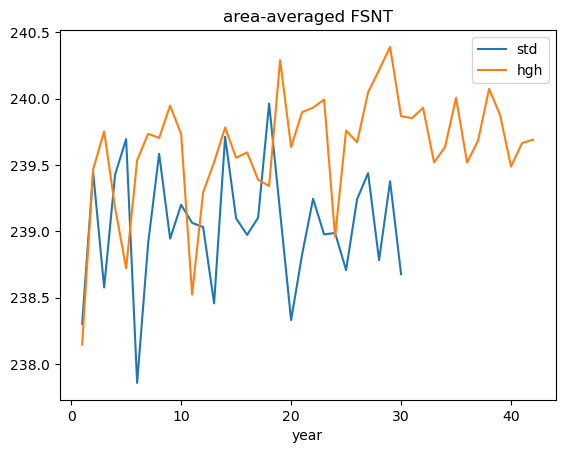

In [57]:
plot_area_average_timeseries('FSNT', 'atm', time_range=['0001-01','0042-12'], time_average='year')

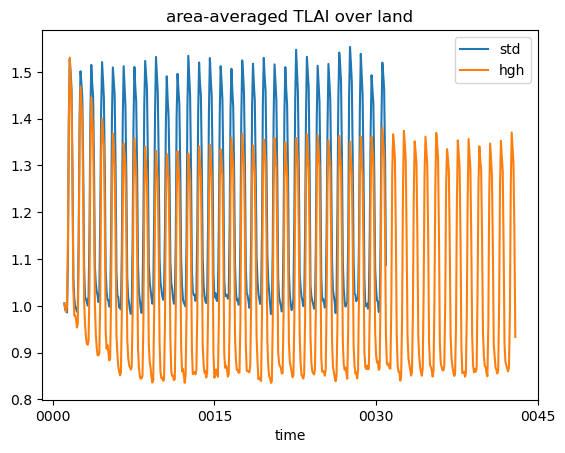

In [58]:
plot_land_area_average_timeseries('TLAI', 'lnd', time_range=['0001-01','0042-12'])

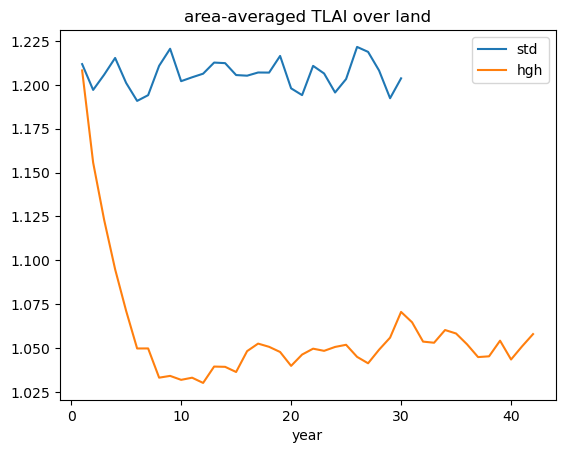

In [59]:
plot_land_area_average_timeseries('TLAI', 'lnd', time_range=['0001-01','0042-12'], time_average='year')

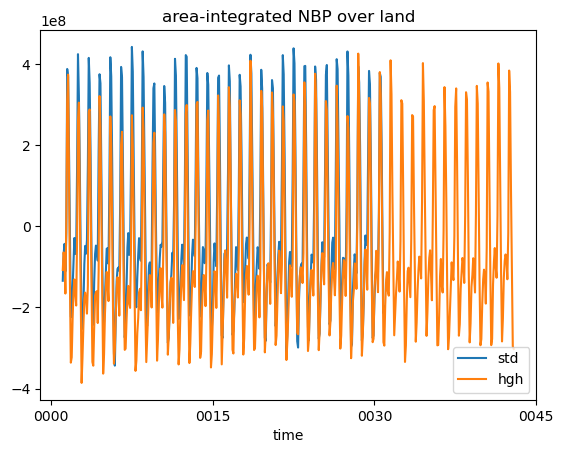

In [60]:
plot_land_area_integrated_timeseries('NBP', 'lnd', time_range=['0001-01','0042-12'])

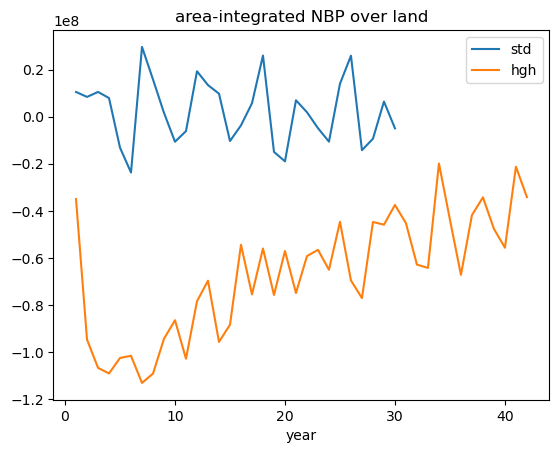

In [61]:
plot_land_area_integrated_timeseries('NBP', 'lnd', time_range=['0001-01','0042-12'], time_average='year')

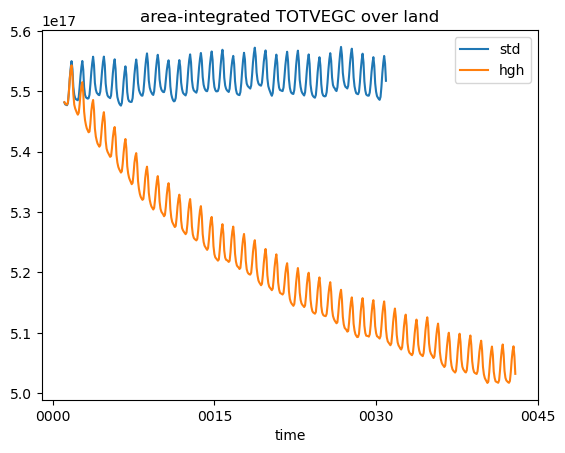

In [62]:
plot_land_area_integrated_timeseries('TOTVEGC', 'lnd', time_range=['0001-01','0042-12'])

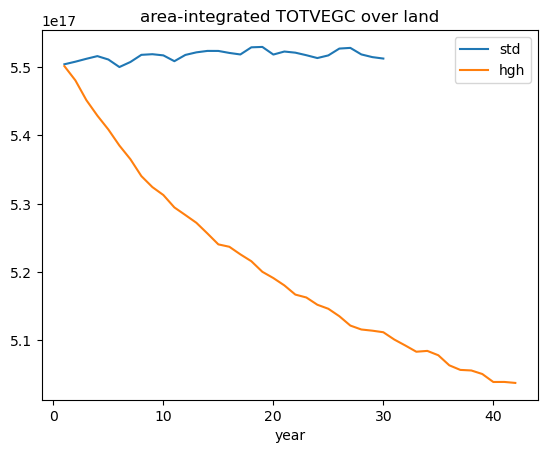

In [63]:
plot_land_area_integrated_timeseries('TOTVEGC', 'lnd', time_range=['0001-01','0042-12'], time_average='year')

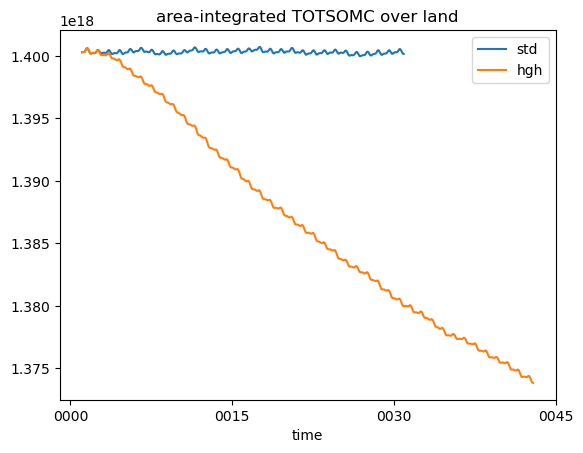

In [64]:
plot_land_area_integrated_timeseries('TOTSOMC', 'lnd', time_range=['0001-01','0042-12'])

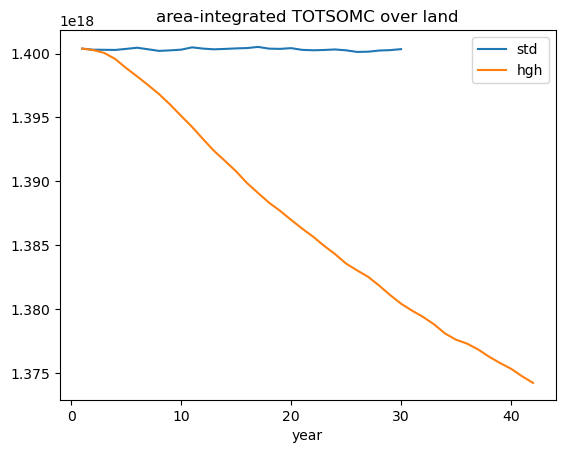

In [65]:
plot_land_area_integrated_timeseries('TOTSOMC', 'lnd', time_range=['0001-01','0042-12'], time_average='year')

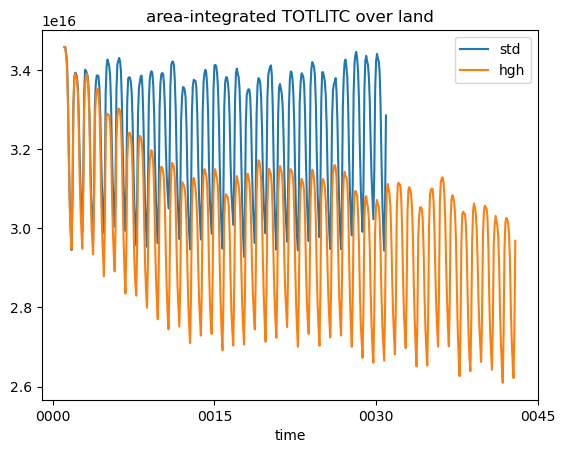

In [66]:
plot_land_area_integrated_timeseries('TOTLITC', 'lnd', time_range=['0001-01','0042-12'])

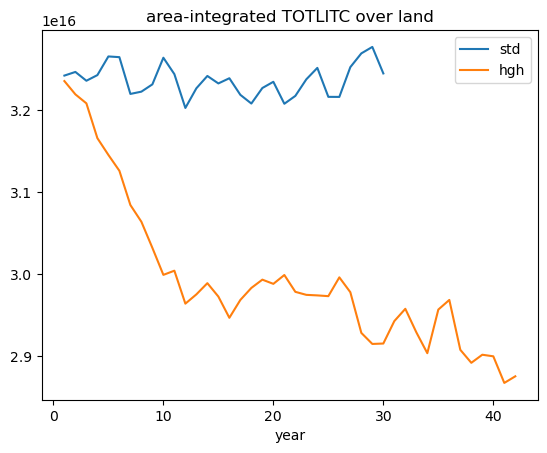

In [67]:
plot_land_area_integrated_timeseries('TOTLITC', 'lnd', time_range=['0001-01','0042-12'], time_average='year')

# One year run

## Atmosphere

In [2]:
case_name = 'b.e21.B1850.f09_g17.FLAT10ctrl-esm.001.leafcn_high.1year'
archive_dir = '/glade/derecho/scratch/bbuchovecky/archive'

cam_h0 = xr.open_mfdataset(f'{archive_dir}/{case_name}/atm/hist/{case_name}.cam.h0.*.nc')
cam_h1 = xr.open_mfdataset(f'{archive_dir}/{case_name}/atm/hist/{case_name}.cam.h1.*.nc')
cam_h6 = xr.open_mfdataset(f'{archive_dir}/{case_name}/atm/hist/{case_name}.cam.h6.*.nc')

In [3]:
cam_h0

<xarray.Dataset>
Dimensions:                  (lat: 192, zlon: 1, time: 12, nbnd: 2, lon: 288,
                              lev: 32, ilev: 33)
Coordinates:
  * lat                      (lat) float64 -90.0 -89.06 -88.12 ... 89.06 90.0
  * zlon                     (zlon) float64 0.0
  * lon                      (lon) float64 0.0 1.25 2.5 ... 356.2 357.5 358.8
  * lev                      (lev) float64 3.643 7.595 14.36 ... 976.3 992.6
  * ilev                     (ilev) float64 2.255 5.032 10.16 ... 985.1 1e+03
  * time                     (time) object 0001-02-01 00:00:00 ... 0002-01-01...
Dimensions without coordinates: nbnd
Data variables: (12/531)
    zlon_bnds                (time, zlon, nbnd) float64 dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    gw                       (time, lat) float64 dask.array<chunksize=(1, 192), meta=np.ndarray>
    hyam                     (time, lev) float64 dask.array<chunksize=(1, 32), meta=np.ndarray>
    hybm                     (time, lev) float64 dask.array<chunksize=(1, 32), meta=np.ndarray>
    P0                       (time) float64 1e+05 1e+05 1e+05 ... 1e+05 1e+05
    hyai                     (time, ilev) float64 dask.array<chunksize=(1, 33), meta=np.ndarray>
    ...                       ...
    soa_c1                   (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    soa_c1SFWET              (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    soa_c2                   (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 192, 288), meta=np.ndarray>
    soa_c2SFWET              (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    wet_deposition_NHx_as_N  (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    wet_deposition_NOy_as_N  (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              b.e21.B1850.f09_g17.FLAT10ctrl-esm.001.leafcn_high.1year
    logname:           bbuchovecky
    host:              derecho2
    initial_file:      b.e21.B1850.f09_g17.CMIP6-esm-piControl.001.cam.i.0151...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  month_1

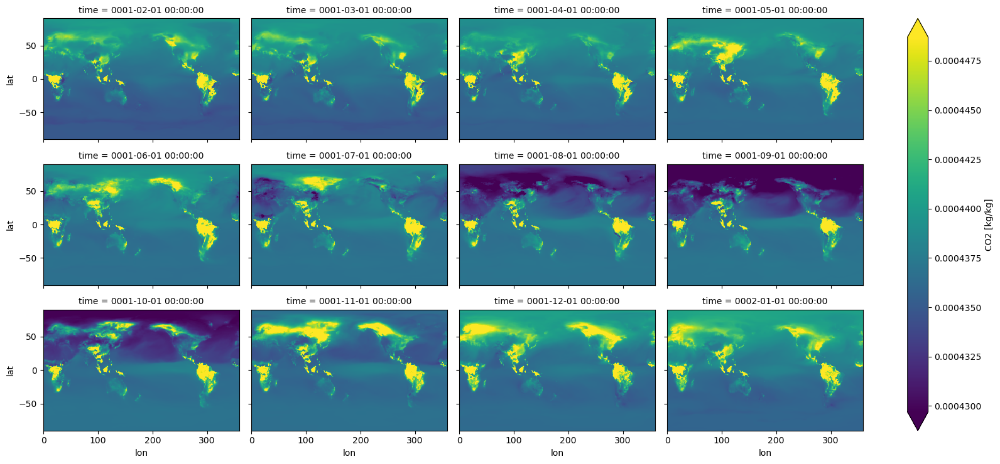

In [7]:
cam_h0['CO2'].isel(lev=-1).plot.pcolormesh(
    figsize=(15,7.5),
    col='time', col_wrap=4,
    add_colorbar=True, robust=True,
    cbar_kwargs={'fraction': 0.025}
)

In [5]:
cam_h1

<xarray.Dataset>
Dimensions:          (lat: 192, lon: 288, time: 366, lev: 32, ilev: 33, nbnd: 2)
Coordinates:
  * lat              (lat) float64 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon              (lon) float64 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lev              (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev             (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * time             (time) object 0001-01-01 00:00:00 ... 0002-01-01 00:00:00
Dimensions without coordinates: nbnd
Data variables: (12/114)
    gw               (time, lat) float64 dask.array<chunksize=(5, 192), meta=np.ndarray>
    hyam             (time, lev) float64 dask.array<chunksize=(5, 32), meta=np.ndarray>
    hybm             (time, lev) float64 dask.array<chunksize=(5, 32), meta=np.ndarray>
    P0               (time) float64 1e+05 1e+05 1e+05 ... 1e+05 1e+05 1e+05
    hyai             (time, ilev) float64 dask.array<chunksize=(5, 33), meta=np.ndarray>
    hybi             (time, ilev) float64 dask.array<chunksize=(5, 33), meta=np.ndarray>
    ...               ...
    U                (time, lev, lat, lon) float32 dask.array<chunksize=(5, 32, 192, 288), meta=np.ndarray>
    U10              (time, lat, lon) float32 dask.array<chunksize=(5, 192, 288), meta=np.ndarray>
    UTGWORO          (time, lev, lat, lon) float32 dask.array<chunksize=(5, 32, 192, 288), meta=np.ndarray>
    V                (time, lev, lat, lon) float32 dask.array<chunksize=(5, 32, 192, 288), meta=np.ndarray>
    Z3               (time, lev, lat, lon) float32 dask.array<chunksize=(5, 32, 192, 288), meta=np.ndarray>
    Z500             (time, lat, lon) float32 dask.array<chunksize=(5, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              b.e21.B1850.f09_g17.FLAT10ctrl-esm.001.leafcn_high.1year
    logname:           bbuchovecky
    host:              derecho2
    initial_file:      b.e21.B1850.f09_g17.CMIP6-esm-piControl.001.cam.i.0151...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  day_1

## Land

In [9]:
case_name = 'b.e21.B1850.f09_g17.FLAT10ctrl-esm.001.leafcn_high.1year'
archive_dir = '/glade/derecho/scratch/bbuchovecky/archive'

# clm_h0 = xr.open_mfdataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h0.*.nc')  # OverflowError -> file size too large?
clm_h1 = xr.open_mfdataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h1.*.nc')
clm_h2 = xr.open_mfdataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h2.*.nc')
clm_h3 = xr.open_mfdataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h3.*.nc')
clm_h4 = xr.open_mfdataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h4.*.nc')

In [10]:
def get_lnd_h0_variable(variable):
    da_list = []
    for mon in range(1,13):
        da = xr.open_dataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h0.0001-{str(mon).zfill(2)}.nc')[variable]
        da_list.append(da.copy(deep=True))
    return xr.concat(da_list, 'time')

In [11]:
clm_h0 = xr.open_mfdataset(f'{archive_dir}/{case_name}/lnd/hist/{case_name}.clm2.h0.0001-01.nc')

In [13]:
clm_h0

<xarray.Dataset>
Dimensions:                          (levgrnd: 25, levlak: 10, levdcmp: 25,
                                      time: 1, hist_interval: 2, lon: 288,
                                      lat: 192, levsoi: 20, ltype: 9, nvegwcs: 4)
Coordinates:
  * levgrnd                          (levgrnd) float32 0.01 0.04 ... 28.87 42.0
  * levlak                           (levlak) float32 0.05 0.6 ... 34.33 44.78
  * levdcmp                          (levdcmp) float32 0.01 0.04 ... 28.87 42.0
  * time                             (time) object 0001-02-01 00:00:00
  * lon                              (lon) float32 0.0 1.25 2.5 ... 357.5 358.8
  * lat                              (lat) float32 -90.0 -89.06 ... 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi, ltype, nvegwcs
Data variables: (12/495)
    mcdate                           (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    mcsec                            (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    mdcur                            (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    mscur                            (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    nstep                            (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    time_bounds                      (time, hist_interval) object dask.array<chunksize=(1, 2), meta=np.ndarray>
    ...                               ...
    XSMRPOOL                         (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    XSMRPOOL_RECOVER                 (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    ZBOT                             (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    ZWT                              (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    ZWT_CH4_UNSAT                    (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
    ZWT_PERCH                        (time, lat, lon) float32 dask.array<chunksize=(1, 192, 288), meta=np.ndarray>
Attributes: (12/100)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 09/04/24 13:07:37
    source:                                    Community Land Model CLM4.0
    hostname:                                  derecho
    ...                                        ...
    cft_irrigated_switchgrass:                 60
    cft_tropical_corn:                         61
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          month_1

In [12]:
query_key = 'NPP'
for var in clm_h0.data_vars:
    if query_key in var:
        print(var)

AGNPP
BGNPP
NPP
NPP_GROWTH
NPP_NACTIVE
NPP_NACTIVE_NH4
NPP_NACTIVE_NO3
NPP_NAM
NPP_NAM_NH4
NPP_NAM_NO3
NPP_NECM
NPP_NECM_NH4
NPP_NECM_NO3
NPP_NFIX
NPP_NNONMYC
NPP_NNONMYC_NH4
NPP_NNONMYC_NO3
NPP_NRETRANS
NPP_NUPTAKE
NUPTAKE_NPP_FRACTION


In [19]:
area = get_lnd_h0_variable('area')
landfrac = get_lnd_h0_variable('landfrac')

tlai = get_lnd_h0_variable('TLAI')
gpp = get_lnd_h0_variable('GPP')
cpool = get_lnd_h0_variable('CPOOL')
totecosysc = get_lnd_h0_variable('TOTECOSYSC')
totvegc = get_lnd_h0_variable('TOTVEGC')
nbp = get_lnd_h0_variable('NBP')

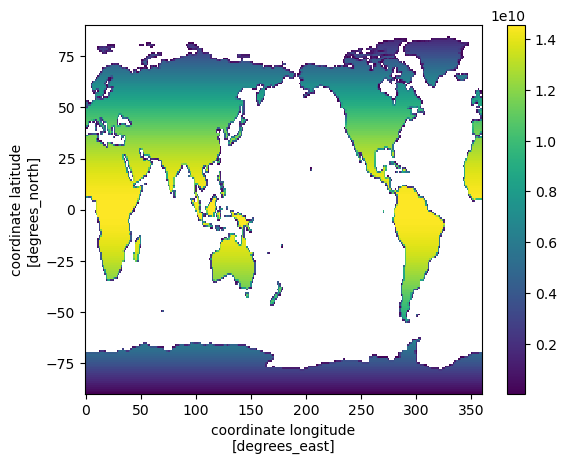

In [24]:
land_area_weight = area.isel(time=0)*1e6*landfrac.isel(time=0)
land_area_weight.plot()

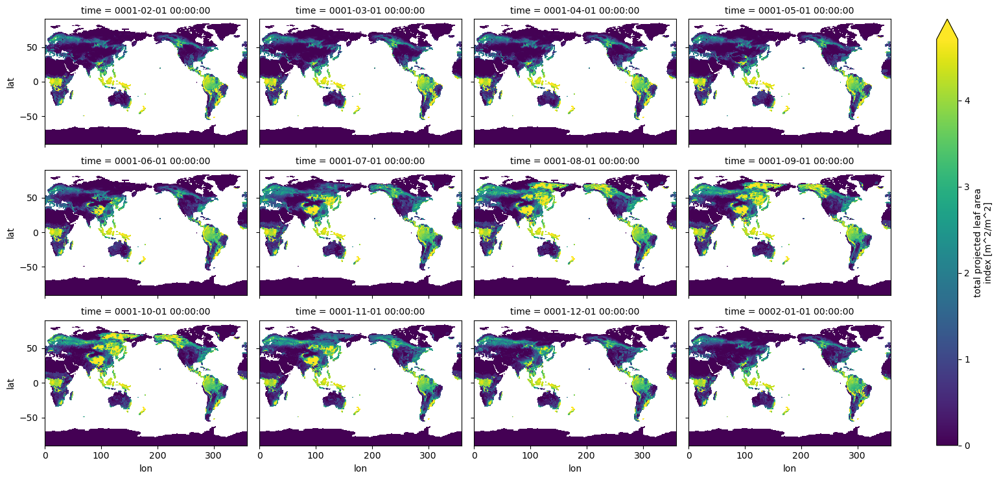

In [75]:
tlai.plot.pcolormesh(
    figsize=(15,7.5),
    col='time', col_wrap=4,
    add_colorbar=True, robust=True,
    cbar_kwargs={'fraction': 0.025}
)

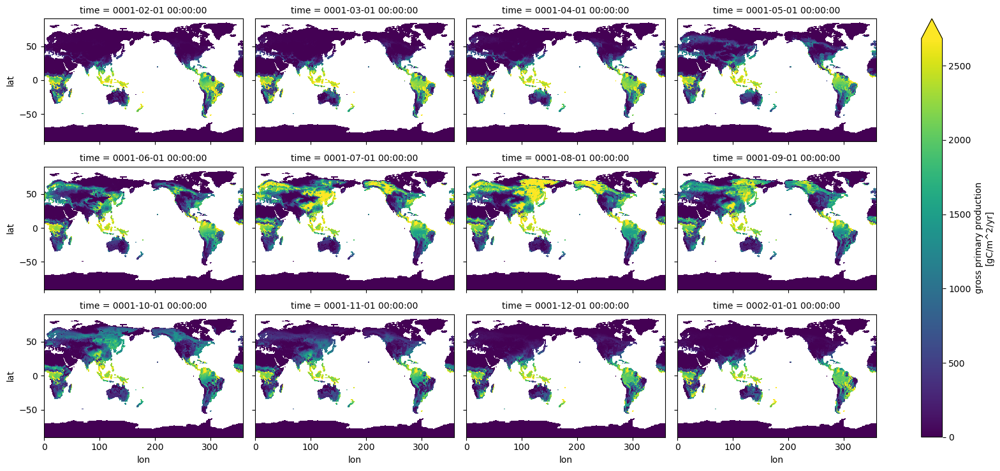

In [81]:
(gpp*60*60*24*365).plot.pcolormesh(
    figsize=(15,7.5),
    col='time', col_wrap=4,
    add_colorbar=True, robust=True,
    cbar_kwargs={'fraction': 0.025, 'label': 'gross primary production\n[gC/m^2/yr]'}
)

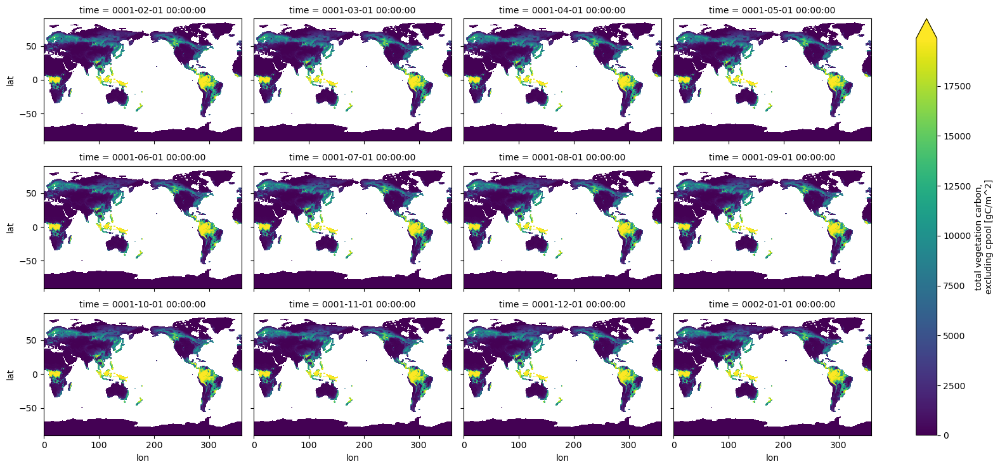

In [16]:
totvegc.plot.pcolormesh(
    figsize=(15,7.5),
    col='time', col_wrap=4,
    add_colorbar=True, robust=True,
    cbar_kwargs={'fraction': 0.025}
)

Text(0.5, 1.0, 'area-integrated TOTVEGC [gC]')

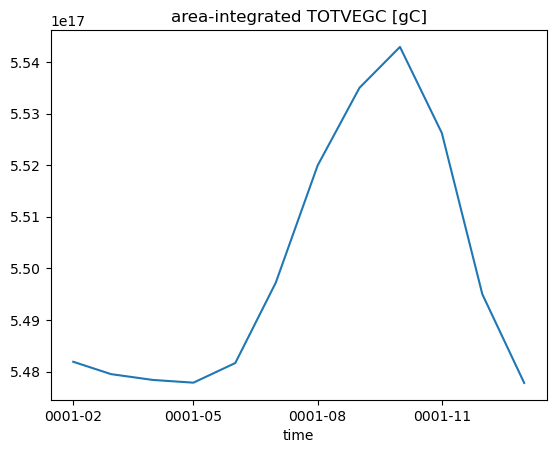

In [25]:
(totvegc*land_area_weight).sum(dim=['lat','lon']).plot()
plt.title('area-integrated TOTVEGC [gC]')

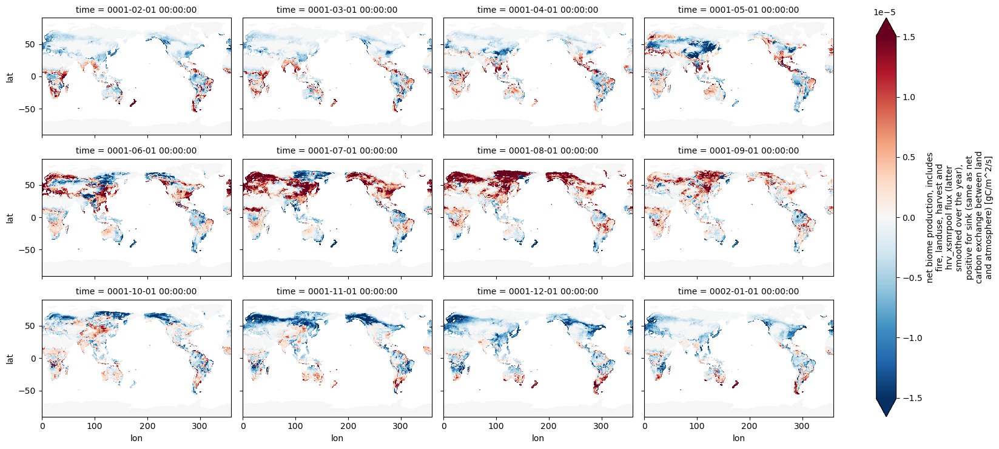

In [21]:
nbp.plot.pcolormesh(
    figsize=(15,7.5),
    col='time', col_wrap=4,
    add_colorbar=True, robust=True,
    cbar_kwargs={'fraction': 0.025}
)

Text(0.5, 1.0, 'area-integrated NBP [gC]')

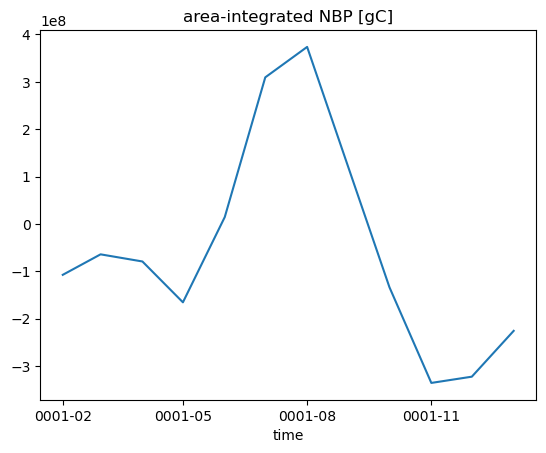

In [26]:
(nbp*land_area_weight).sum(dim=['lat','lon']).plot()
plt.title('area-integrated NBP [gC]')

In [39]:
def get_high_variable(variable, domain, time_range=['0001-01', '0003-12']):
    case_name = 'b.e21.B1850.f09_g17.FLAT10ctrl-esm.001.leafcn_high.1year'
    archive_dir = '/glade/derecho/scratch/bbuchovecky/archive'

    comp_dict = {
        'atm': 'cam',
        'lnd': 'clm2',
    }
    comp = comp_dict[domain]

    da_list = []
    
    start_year = int(time_range[0][:4])
    start_month = int(time_range[0][5:])

    end_year = int(time_range[1][:4])
    end_month = int(time_range[1][5:])

    for year in range(start_year, end_year):
        for month in range(1, 13):
            da = xr.open_dataset(f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0.{str(year).zfill(4)}-{str(mon).zfill(2)}.nc')[variable]
            da_list.append(da.copy(deep=True))

    for month in range(1, end_month):
        da = xr.open_dataset(f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0..{str(end_year).zfill(4)}-{str(mon).zfill(2)}.nc')[variable]
        da_list.append(da.copy(deep=True))    

    # for mon in range(1,13):
    #     da = xr.open_dataset(f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0.0001-{str(mon).zfill(2)}.nc')[variable]
    #     da_list.append(da.copy(deep=True))
    return xr.concat(da_list, 'time')


def get_std_variable(variable, domain):
    archive_dir = '/glade/campaign/cgd/tss/lawrence/archive'
    case_name = 'b.e21.B1850.f09_g17.FLAT10ctrl-esm.001'

    comp_dict = {
        'atm': 'cam',
        'lnd': 'clm2',
    }
    comp = comp_dict[domain]

    da_list = []
    for mon in range(1,13):
        da = xr.open_dataset(f'{archive_dir}/{case_name}/{domain}/hist/{case_name}.{comp}.h0.0001-{str(mon).zfill(2)}.nc')[variable]
        da_list.append(da.copy(deep=True))
    return xr.concat(da_list, 'time')

nbp_high = get_high_variable('NBP', 'lnd')
nbp_std = get_std_variable('NBP', 'lnd')

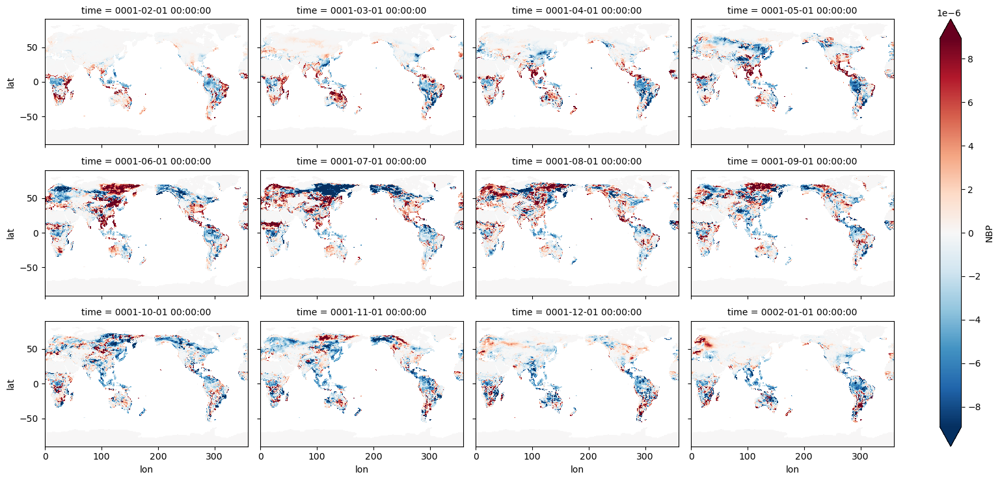

In [42]:
(nbp_high - nbp_std).plot.pcolormesh(
    figsize=(15,7.5),
    col='time', col_wrap=4,
    add_colorbar=True, robust=True,
    cbar_kwargs={'fraction': 0.025}
)

# Parameter file

In [ ]:
leafcn_high = xr.open_dataset('/glade/u/home/djk2120/for/abby/leafcn_high.nc')
leafcn_low = xr.open_dataset('/glade/u/home/djk2120/for/abby/leafcn_low.nc')

In [ ]:
leafcn_high['leafcn']

<xarray.DataArray 'leafcn' (pft: 79)>
[79 values with dtype=float64]
Coordinates:
    pftname  (pft) |S40 ...
Dimensions without coordinates: pft
Attributes:
    note:     default leafcn multiplied by 1.3

In [ ]:
leafcn_low['leafcn']

<xarray.DataArray 'leafcn' (pft: 79)>
[79 values with dtype=float64]
Coordinates:
    pftname  (pft) |S40 ...
Dimensions without coordinates: pft
Attributes:
    note:     default leafcn multiplied by 0.7